In [1]:
import torch
from torch import nn
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import random
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

import seaborn as sns

import pandas as pd
from collections import Counter
%matplotlib inline

In [2]:
device="cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [3]:
import os 

def walk_through_dir(dir_path):
    for dir_path, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} Directories and {len(filenames)} Images in '{dir_path}'.")

image_path = "/kaggle/input/pizza-steak-sushi/"
walk_through_dir(image_path)


There are 2 Directories and 0 Images in '/kaggle/input/pizza-steak-sushi/'.
There are 3 Directories and 0 Images in '/kaggle/input/pizza-steak-sushi/test'.
There are 0 Directories and 19 Images in '/kaggle/input/pizza-steak-sushi/test/steak'.
There are 0 Directories and 31 Images in '/kaggle/input/pizza-steak-sushi/test/sushi'.
There are 0 Directories and 25 Images in '/kaggle/input/pizza-steak-sushi/test/pizza'.
There are 3 Directories and 0 Images in '/kaggle/input/pizza-steak-sushi/train'.
There are 0 Directories and 75 Images in '/kaggle/input/pizza-steak-sushi/train/steak'.
There are 0 Directories and 72 Images in '/kaggle/input/pizza-steak-sushi/train/sushi'.
There are 0 Directories and 78 Images in '/kaggle/input/pizza-steak-sushi/train/pizza'.


In [4]:
train_dir = os.path.join(image_path, "train")
test_dir = os.path.join(image_path, "test")

print(train_dir, test_dir)

/kaggle/input/pizza-steak-sushi/train /kaggle/input/pizza-steak-sushi/test


# visualize images from train data

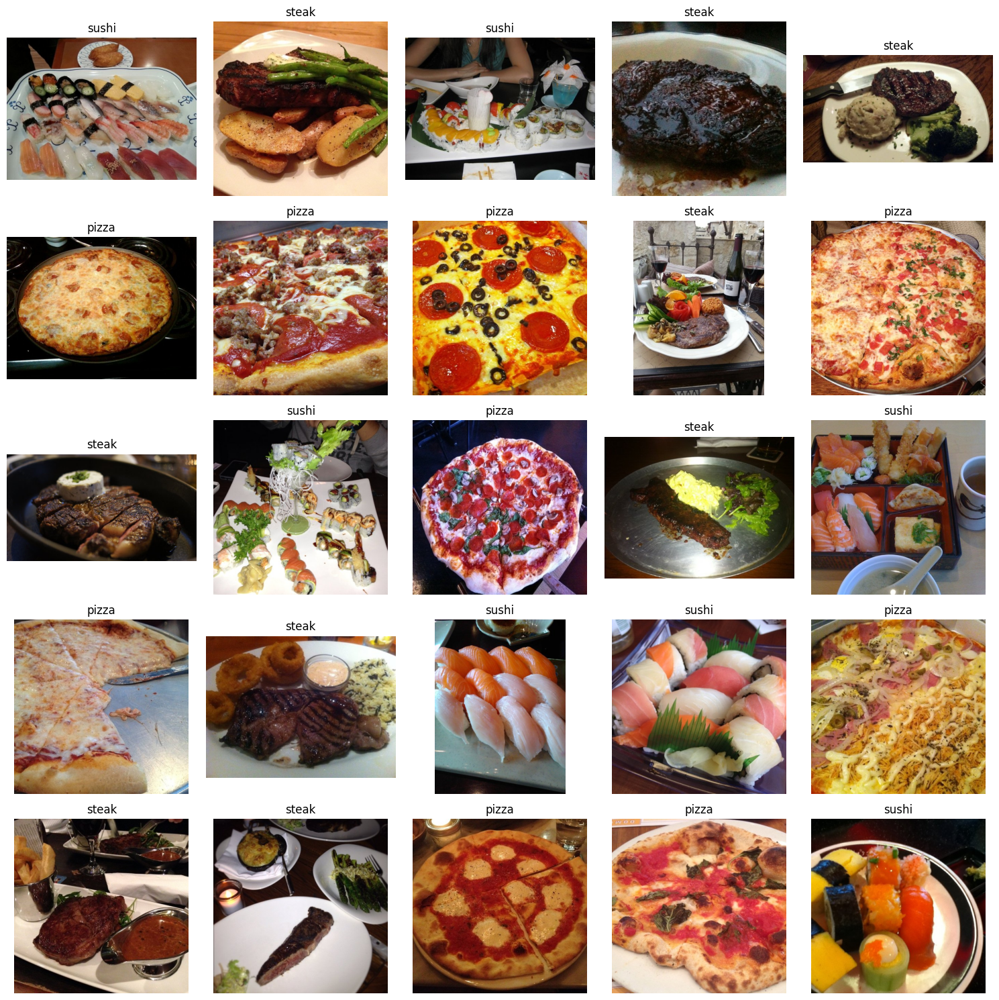

In [5]:

classes = os.listdir(train_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(train_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()


# visualize Images from test data

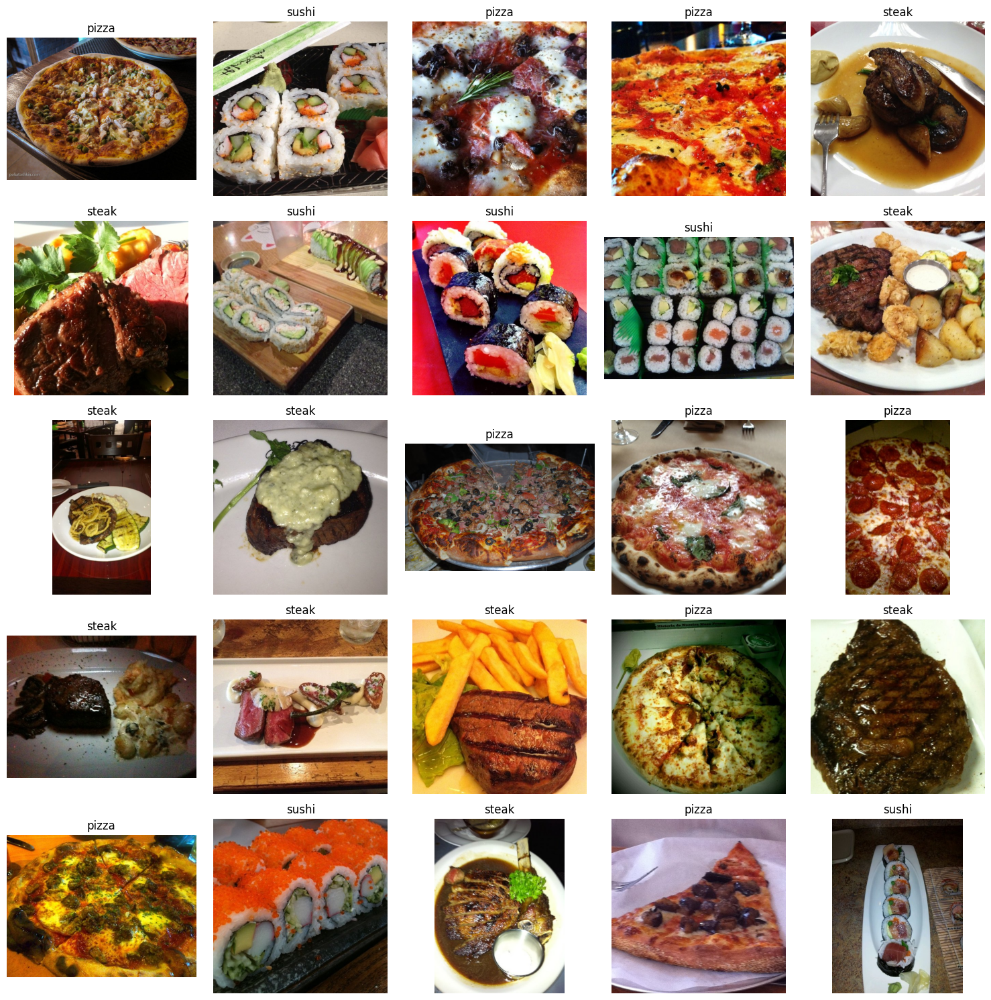

In [6]:

classes = os.listdir(test_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(test_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()


# transform Images

In [7]:
data_transform=transforms.Compose([transforms.Resize(size=(64,64)),transforms.RandomHorizontalFlip(p=0.5),
                                 transforms.ToTensor()])

In [8]:
from pathlib import Path


image_path = Path("/kaggle/input/pizza-steak-sushi/")

# Get list of image paths
image_path_list = list(image_path.glob("*/*/*.jpg"))


# transform Images

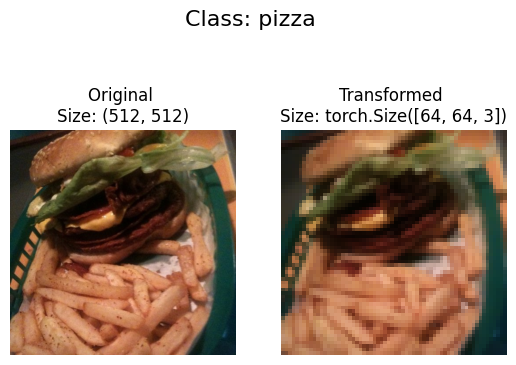

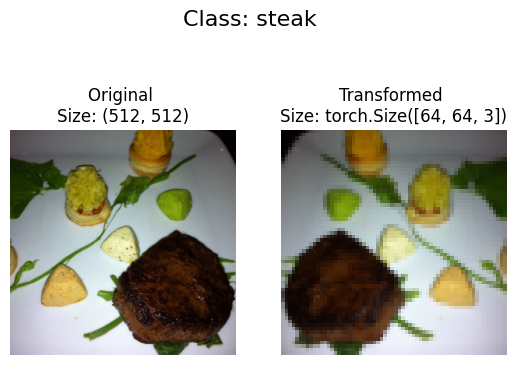

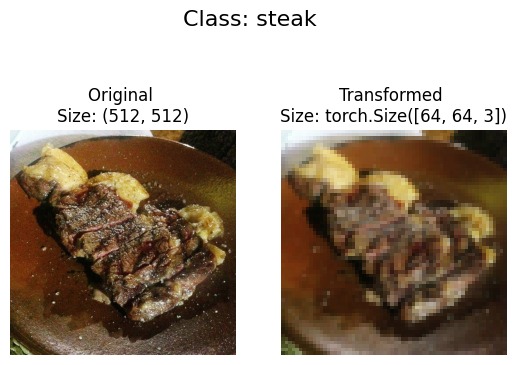

In [9]:
def plot_transformed_images(image_paths, transform, n=3, seed=42):
    random.seed(seed)
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")

            transformed_image = transform(f).permute(1, 2, 0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

plot_transformed_images(image_path_list, transform=data_transform, n=3)

#  Use ImageFolder to create dataset(s)

In [10]:
train_data = datasets.ImageFolder(root=train_dir, transform=data_transform, target_transform=None)
test_data = datasets.ImageFolder(root=test_dir, transform=data_transform)

print(f"Train data:\n{train_data}\nTest data:\n{test_data}")


Train data:
Dataset ImageFolder
    Number of datapoints: 225
    Root location: /kaggle/input/pizza-steak-sushi/train
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )
Test data:
Dataset ImageFolder
    Number of datapoints: 75
    Root location: /kaggle/input/pizza-steak-sushi/test
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )


In [11]:
class_names = train_data.classes
class_names

['pizza', 'steak', 'sushi']

In [12]:
class_dict = train_data.class_to_idx
class_dict

{'pizza': 0, 'steak': 1, 'sushi': 2}

In [13]:
len(train_data), len(test_data)

(225, 75)

In [14]:
img, label = train_data[0][0], train_data[0][1]
print(f"Image tensor:\n{img}")
print(f"Image shape: {img.shape}")
print(f"Image datatype: {img.dtype}")
print(f"Image label: {label}")
print(f"Label datatype: {type(label)}")

Image tensor:
tensor([[[0.1137, 0.1020, 0.0980,  ..., 0.1255, 0.1216, 0.1176],
         [0.1059, 0.0980, 0.0980,  ..., 0.1294, 0.1294, 0.1294],
         [0.1020, 0.0980, 0.0941,  ..., 0.1333, 0.1333, 0.1333],
         ...,
         [0.1098, 0.1098, 0.1255,  ..., 0.1686, 0.1647, 0.1686],
         [0.0902, 0.0941, 0.1098,  ..., 0.1686, 0.1647, 0.1686],
         [0.0863, 0.0863, 0.0980,  ..., 0.1686, 0.1647, 0.1647]],

        [[0.0745, 0.0706, 0.0745,  ..., 0.0588, 0.0588, 0.0588],
         [0.0745, 0.0706, 0.0745,  ..., 0.0627, 0.0627, 0.0627],
         [0.0706, 0.0745, 0.0745,  ..., 0.0706, 0.0706, 0.0706],
         ...,
         [0.1255, 0.1333, 0.1373,  ..., 0.2510, 0.2392, 0.2392],
         [0.1098, 0.1176, 0.1255,  ..., 0.2510, 0.2392, 0.2314],
         [0.1020, 0.1059, 0.1137,  ..., 0.2431, 0.2353, 0.2275]],

        [[0.0941, 0.0902, 0.0902,  ..., 0.0157, 0.0196, 0.0196],
         [0.0902, 0.0863, 0.0902,  ..., 0.0196, 0.0157, 0.0196],
         [0.0902, 0.0902, 0.0902,  ..., 0.01

# Rearrange the order of dimensions

Original shape: torch.Size([3, 64, 64]) -> [color_channels, height, width]
Image permute shape: torch.Size([64, 64, 3]) -> [height, width, color_channels]


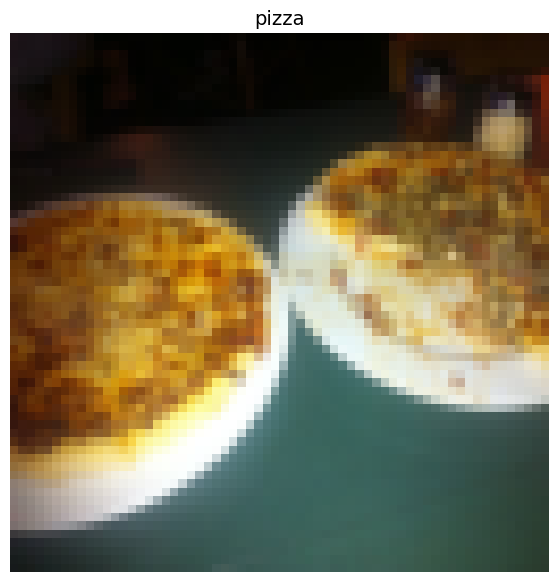

In [15]:
img_permute = img.permute(1, 2, 0)

# Print out different shapes (before and after permute)
print(f"Original shape: {img.shape} -> [color_channels, height, width]")
print(f"Image permute shape: {img_permute.shape} -> [height, width, color_channels]")

# Plot the image
plt.figure(figsize=(10, 7))
plt.imshow(img.permute(1, 2, 0))
plt.axis("off")
plt.title(class_names[label], fontsize=14)
plt.show()

# Turn train and test Datasets into DataLoaders

In [16]:
train_dataloader = DataLoader(dataset=train_data, 
                              batch_size=8, # how many samples per batch?
                              num_workers=1, # how many subprocesses to use for data loading? (higher = more)
                              shuffle=True) # shuffle the data?

test_dataloader = DataLoader(dataset=test_data, 
                             batch_size=8, 
                             num_workers=1, 
                             shuffle=False) # don't usually need to shuffle testing data

train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x7b095292bf10>,
 <torch.utils.data.dataloader.DataLoader at 0x7b095292bf40>)

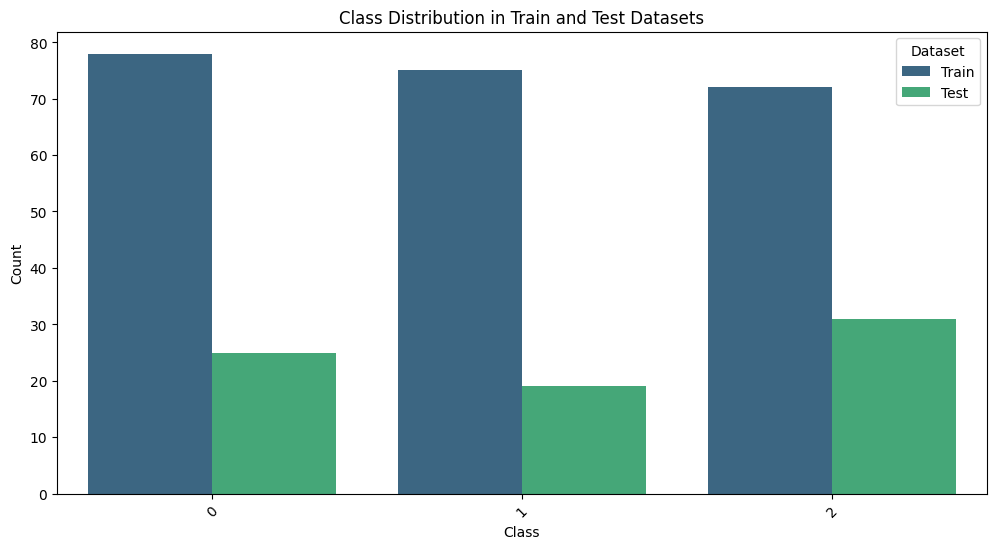

In [17]:


def get_labels(dataloader):
    labels = []
    for _, label in dataloader:
        labels.extend(label.numpy())
    return labels

train_labels = get_labels(train_dataloader)
test_labels = get_labels(test_dataloader)

train_class_counts = Counter(train_labels)
test_class_counts = Counter(test_labels)

train_df = pd.DataFrame(train_class_counts.items(), columns=['Class', 'Count'])
test_df = pd.DataFrame(test_class_counts.items(), columns=['Class', 'Count'])

train_df['Dataset'] = 'Train'
test_df['Dataset'] = 'Test'

combined_df = pd.concat([train_df, test_df])

plt.figure(figsize=(12, 6))
sns.barplot(data=combined_df, x='Class', y='Count', hue='Dataset', palette='viridis')
plt.title('Class Distribution in Train and Test Datasets')
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend(title='Dataset')
plt.xticks(rotation=45)
plt.show()


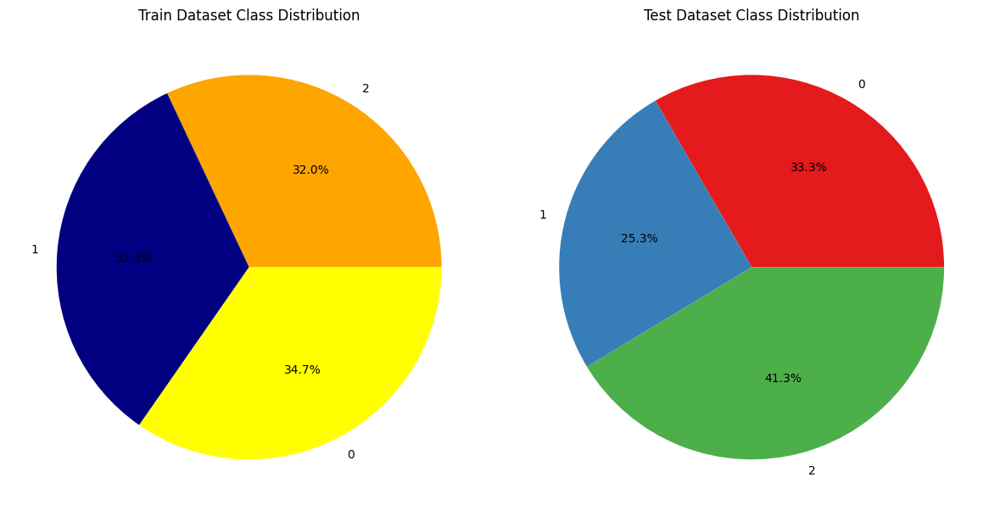

In [18]:


def get_labels(dataloader):
    labels = []
    for _, label in dataloader:
        labels.extend(label.numpy())
    return labels

train_labels = get_labels(train_dataloader)
test_labels = get_labels(test_dataloader)

train_class_counts = Counter(train_labels)
test_class_counts = Counter(test_labels)

train_df = pd.DataFrame(train_class_counts.items(), columns=['Class', 'Count'])
test_df = pd.DataFrame(test_class_counts.items(), columns=['Class', 'Count'])

train_df['Dataset'] = 'Train'
test_df['Dataset'] = 'Test'

combined_df = pd.concat([train_df, test_df])

# Plotting Pie Charts
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].pie(train_df['Count'], labels=train_df['Class'], autopct='%1.1f%%', colors=["orange","navy","yellow"])
axes[0].set_title('Train Dataset Class Distribution')

axes[1].pie(test_df['Count'], labels=test_df['Class'], autopct='%1.1f%%', colors=plt.cm.Set1.colors)
axes[1].set_title('Test Dataset Class Distribution')

plt.tight_layout()
plt.show()


In [19]:
img, label = next(iter(train_dataloader))

# Batch size will now be 1, try changing the batch_size parameter above and see what happens
print(f"Image shape: {img.shape} -> [batch_size, color_channels, height, width]")
print(f"Label shape: {label.shape}")

Image shape: torch.Size([8, 3, 64, 64]) -> [batch_size, color_channels, height, width]
Label shape: torch.Size([8])


In [20]:
from typing import Tuple, Dict, List

In [21]:
# Instance of torchvision.datasets.ImageFolder()
train_data.classes, train_data.class_to_idx

(['pizza', 'steak', 'sushi'], {'pizza': 0, 'steak': 1, 'sushi': 2})

In [22]:
class TinyVGG(nn.Module):
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int) -> None:
        super().__init__()
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_shape, 
                      out_channels=hidden_units, 
                      kernel_size=3, 
                      stride=1, 
                      padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_units, 
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,
                         stride=2)
        )
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=hidden_units*16*16,
                      out_features=output_shape)
        )
    
    def forward(self, x: torch.Tensor):
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        x = self.classifier(x)
        return x

torch.manual_seed(42)
model_0 = TinyVGG(input_shape=3, 
                  hidden_units=10, 
                  output_shape=len(train_data.classes)).to(device)
model_0


TinyVGG(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=2560, out_features=3, bias=True)
  )
)

In [23]:
# Install torchinfo if it's not available, import it if it is
try: 
    import torchinfo
except:
    !pip install torchinfo
    import torchinfo
    
from torchinfo import summary
summary(model_0, input_size=[1, 3, 64, 64])

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG                                  [1, 3]                    --
├─Sequential: 1-1                        [1, 10, 32, 32]           --
│    └─Conv2d: 2-1                       [1, 10, 64, 64]           280
│    └─ReLU: 2-2                         [1, 10, 64, 64]           --
│    └─Conv2d: 2-3                       [1, 10, 64, 64]           910
│    └─ReLU: 2-4                         [1, 10, 64, 64]           --
│    └─MaxPool2d: 2-5                    [1, 10, 32, 32]           --
├─Sequential: 1-2                        [1, 10, 16, 16]           --
│    └─Conv2d: 2-6                       [1, 10, 32, 32]           910
│    └─ReLU: 2-7                         [1, 10, 32, 32]           --
│    └─Conv2d: 2-8                       [1, 10, 32, 32]           910
│    └─ReLU: 2-9                         [1, 10, 32, 32]           --
│    └─MaxPool2d: 2-10                   [1, 10, 16, 16]           --
├─Sequentia

# Create train & test loop functions

In [24]:
def train_step(model: torch.nn.Module, 
               dataloader: torch.utils.data.DataLoader, 
               loss_fn: torch.nn.Module, 
               optimizer: torch.optim.Optimizer):
    # Put model in train mode
    model.train()
    
    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0
    
    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item() 

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metrics across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch 
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

In [25]:
def test_step(model: torch.nn.Module, 
              dataloader: torch.utils.data.DataLoader, 
              loss_fn: torch.nn.Module):
    # Put model in eval mode
    model.eval() 
    
    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0
    
    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)
    
            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()
            
            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))
            
    # Adjust metrics to get average loss and accuracy per batch 
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

In [26]:
from tqdm.auto import tqdm

# 1. Take in various parameters required for training and test steps
def train(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          test_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5):
    
    # 2. Create empty results dictionary
    results = {"train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }
    
    # 3. Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer)
        test_loss, test_acc = test_step(model=model,
            dataloader=test_dataloader,
            loss_fn=loss_fn)
        
        # 4. Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
        )

        # 5. Update results dictionary
        # Ensure all data is moved to CPU and converted to float for storage
        results["train_loss"].append(train_loss.item() if isinstance(train_loss, torch.Tensor) else train_loss)
        results["train_acc"].append(train_acc.item() if isinstance(train_acc, torch.Tensor) else train_acc)
        results["test_loss"].append(test_loss.item() if isinstance(test_loss, torch.Tensor) else test_loss)
        results["test_acc"].append(test_acc.item() if isinstance(test_acc, torch.Tensor) else test_acc)

    # 6. Return the filled results at the end of the epochs
    return results

In [27]:
# Set random seeds
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

# Set number of epochs
NUM_EPOCHS = 50

# Recreate an instance of TinyVGG
model_0 = TinyVGG(input_shape=3, # number of color channels (3 for RGB) 
                  hidden_units=10, 
                  output_shape=len(train_data.classes)).to(device)

# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model_0.parameters(), lr=0.001)

# Start the timer
from timeit import default_timer as timer 
start_time = timer()

# Train model_0 
model_0_results = train(model=model_0, 
                        train_dataloader=train_dataloader,
                        test_dataloader=test_dataloader,
                        optimizer=optimizer,
                        loss_fn=loss_fn, 
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.1116 | train_acc: 0.2716 | test_loss: 1.1195 | test_acc: 0.3125
Epoch: 2 | train_loss: 1.0980 | train_acc: 0.3405 | test_loss: 1.1082 | test_acc: 0.2375
Epoch: 3 | train_loss: 1.0992 | train_acc: 0.3190 | test_loss: 1.1020 | test_acc: 0.4000
Epoch: 4 | train_loss: 1.0629 | train_acc: 0.5647 | test_loss: 1.0652 | test_acc: 0.3375
Epoch: 5 | train_loss: 0.9494 | train_acc: 0.5776 | test_loss: 1.1236 | test_acc: 0.3750
Epoch: 6 | train_loss: 0.9553 | train_acc: 0.5259 | test_loss: 1.0490 | test_acc: 0.4500
Epoch: 7 | train_loss: 0.8881 | train_acc: 0.5991 | test_loss: 1.0149 | test_acc: 0.4208
Epoch: 8 | train_loss: 0.8192 | train_acc: 0.6379 | test_loss: 1.0008 | test_acc: 0.4458
Epoch: 9 | train_loss: 0.7985 | train_acc: 0.6422 | test_loss: 1.0525 | test_acc: 0.4833
Epoch: 10 | train_loss: 0.7926 | train_acc: 0.6336 | test_loss: 1.0173 | test_acc: 0.4208
Epoch: 11 | train_loss: 0.7689 | train_acc: 0.6422 | test_loss: 0.9940 | test_acc: 0.4833
Epoch: 12 | train_l

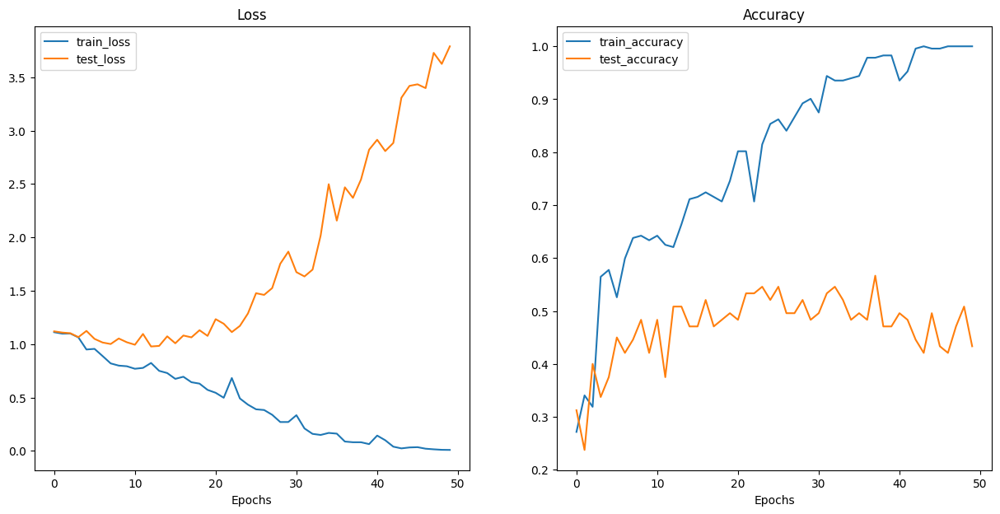

In [28]:
def plot_loss_curves(results: Dict[str, List[float]]):
    loss = results['train_loss']
    test_loss = results['test_loss']
    accuracy = results['train_acc']
    test_accuracy = results['test_acc']
    epochs = range(len(results['train_loss']))
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()
    
plot_loss_curves(model_0_results)

<Figure size 1000x800 with 0 Axes>

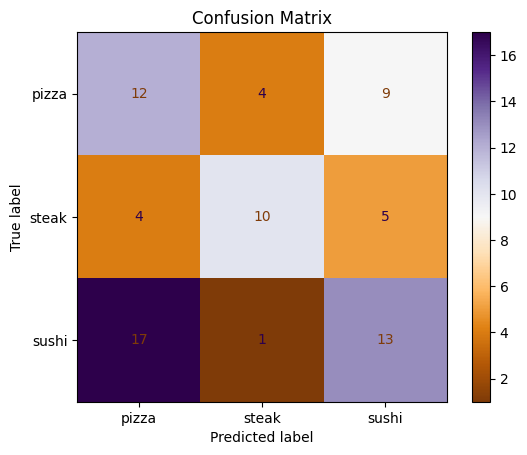

In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


# Set model to evaluation mode
model_0.eval()

all_labels = []
all_preds = []
all_outputs = []
# Turn on inference mode
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        outputs = model_0(X)
        all_outputs.append(outputs.cpu().numpy())
        _, preds = torch.max(outputs, 1)

        all_labels.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Get class names from train data
class_names = train_data.classes
plt.figure(figsize=(10,8))
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='PuOr', values_format='d')
plt.title('Confusion Matrix')
plt.show()


# Classification Report

In [30]:
from sklearn.metrics import classification_report
print(classification_report(all_labels,all_preds, target_names=class_names))

              precision    recall  f1-score   support

       pizza       0.36      0.48      0.41        25
       steak       0.67      0.53      0.59        19
       sushi       0.48      0.42      0.45        31

    accuracy                           0.47        75
   macro avg       0.50      0.48      0.48        75
weighted avg       0.49      0.47      0.47        75



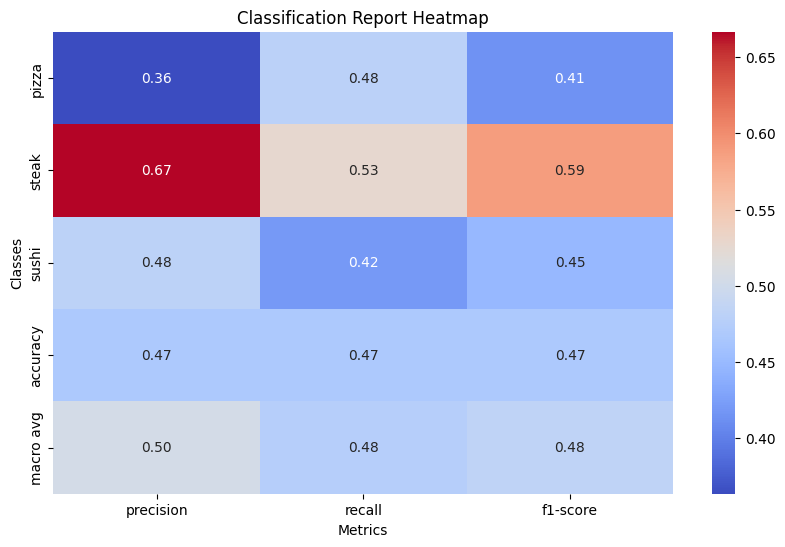

In [31]:

report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plotting the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, fmt=".2f", cmap="coolwarm")
plt.title('Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.show()

# Accuracy Score

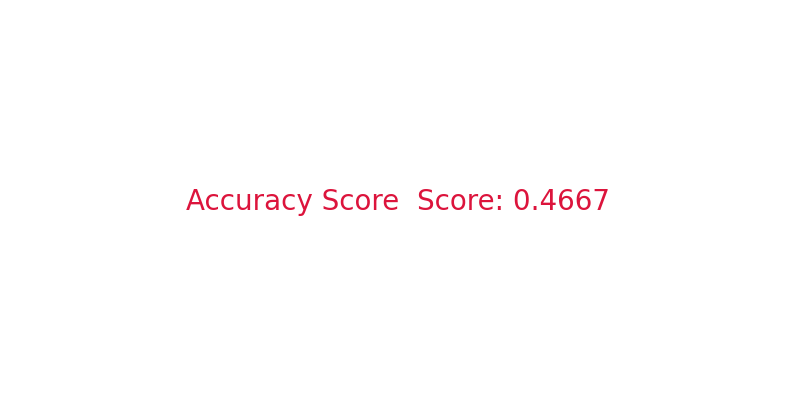

In [32]:
from sklearn.metrics import (
    accuracy_score,
    brier_score_loss,
    log_loss,
    matthews_corrcoef,
    roc_auc_score,
    cohen_kappa_score
)

plt.figure(figsize=(10,5),facecolor="white")
acc_score = accuracy_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Accuracy Score  Score: {acc_score:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()


# ROC AUC Score

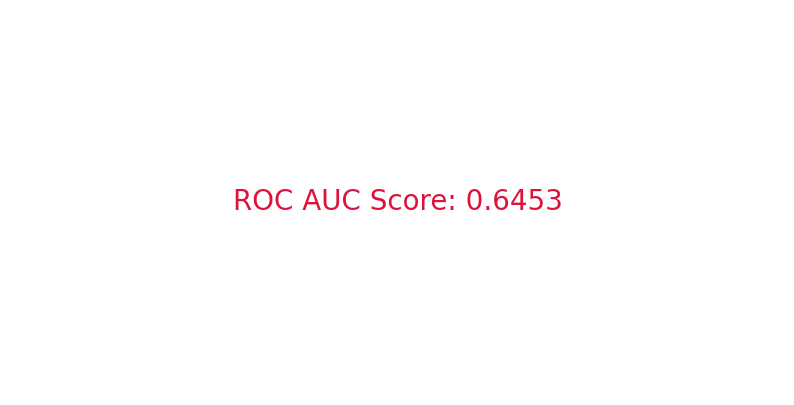

In [33]:


model_0.eval()
all_labels = []
all_outputs = []

with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        outputs = model_0(X)
        
        # Apply softmax to get probabilities
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        all_outputs.append(probabilities.cpu().numpy())  # Collect probabilities

        all_labels.extend(y.cpu().numpy())

# Convert list of outputs to a 2D array
all_outputs = np.vstack(all_outputs)  # Stack the probabilities to get shape (n_samples, n_classes)

# Calculate ROC AUC score
roc_auc = roc_auc_score(all_labels, all_outputs, multi_class='ovr')

plt.figure(figsize=(10, 5), facecolor='white')
plt.plot([])
plt.text(0, 0, f'ROC AUC Score: {roc_auc:.4f}', fontsize=20, ha='center', va='center', color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()


# Cohen Kappa Score

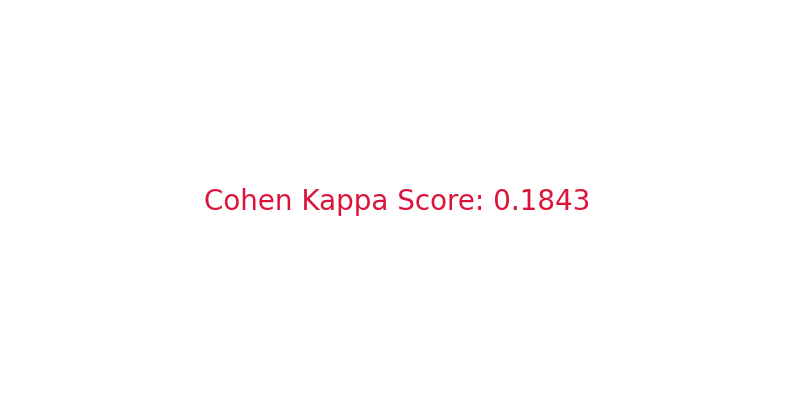

In [34]:

plt.figure(figsize=(10,5),facecolor="white")
kappa = cohen_kappa_score(all_labels,all_preds)
plt.plot([])
plt.text(0,0, f'Cohen Kappa Score: {kappa:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

# Matthews Correlation Coefficient

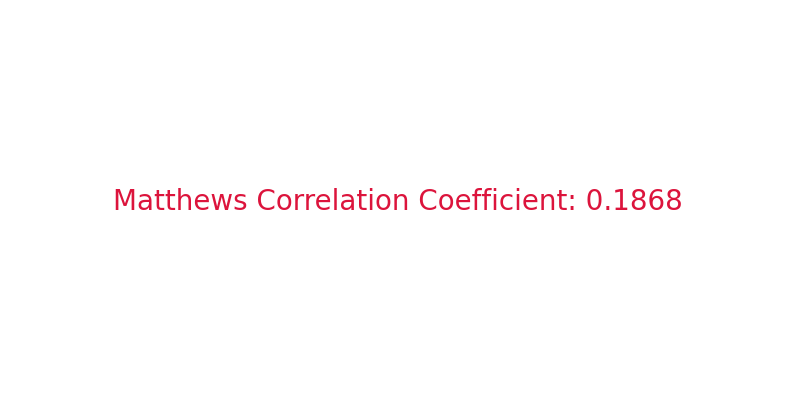

In [35]:
plt.figure(figsize=(10,5),facecolor="white")
mcc = matthews_corrcoef(all_labels,all_preds)


plt.plot([])
plt.text(0,0, f'Matthews Correlation Coefficient: {mcc:.4f}', fontsize=20, ha='center', va='center',color="crimson")
plt.axis('off')

# Set the x-axis limits
plt.xlim(-1, 1)
plt.ylim(-1,1)

plt.show()

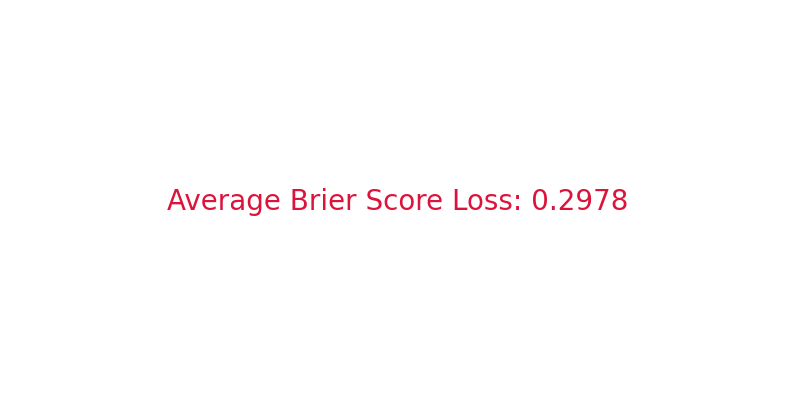

In [36]:


# Calculate Brier Score Loss for each class
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_losses.append(brier_score_loss(y_true_binary, y_prob))

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

plt.figure(figsize=(10, 5), facecolor='white')
plt.plot([])
plt.text(0, 0, f'Average Brier Score Loss: {avg_brier_loss:.4f}', fontsize=20, ha='center', va='center', color="crimson")
plt.axis('off')
plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()

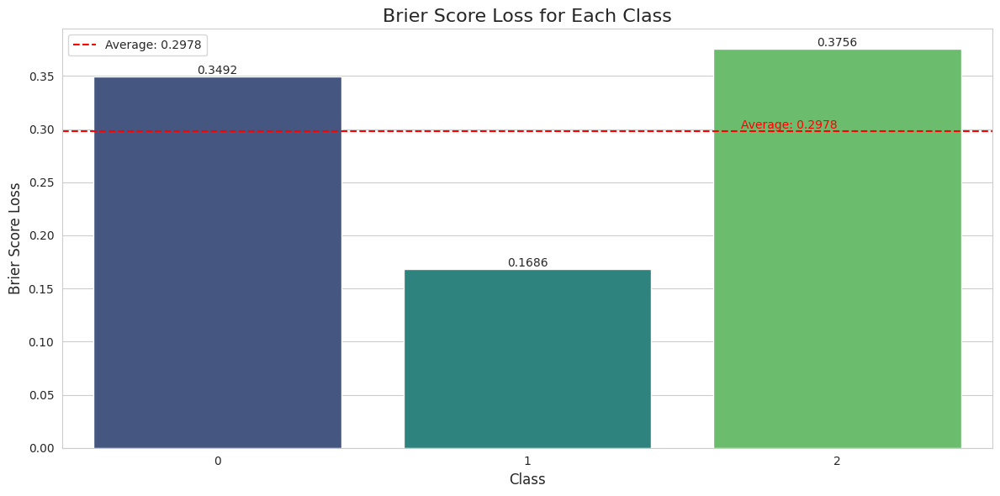

Class 0: Brier Score Loss = 0.3492
Class 1: Brier Score Loss = 0.1686
Class 2: Brier Score Loss = 0.3756
Average Brier Score Loss: 0.2978


In [37]:



# Calculate Brier Score Loss for each class
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_loss = brier_score_loss(y_true_binary, y_prob)
    brier_losses.append(brier_loss)

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

# Create a DataFrame for Seaborn
df = pd.DataFrame({
    'Class': range(num_classes),
    'Brier Score Loss': brier_losses
})

# Plotting
plt.figure(figsize=(12, 6), facecolor='white')
sns.set_style("whitegrid")

# Create the bar plot
ax = sns.barplot(x='Class', y='Brier Score Loss', data=df, palette='viridis')

# Customize the plot
plt.title('Brier Score Loss for Each Class', fontsize=16)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Brier Score Loss', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(brier_losses):
    ax.text(i, v, f'{v:.4f}', ha='center', va='bottom')

# Add a horizontal line for the average Brier Score Loss
plt.axhline(y=avg_brier_loss, color='r', linestyle='--', label=f'Average: {avg_brier_loss:.4f}')

# Add text for average Brier Score Loss
plt.text(num_classes-1, avg_brier_loss, f'Average: {avg_brier_loss:.4f}', 
         fontsize=10, va='bottom', ha='right', color='r')

plt.legend()
plt.tight_layout()
plt.show()

# Print out the Brier Score Loss for each class
for i, loss in enumerate(brier_losses):
    print(f"Class {i}: Brier Score Loss = {loss:.4f}")
print(f"Average Brier Score Loss: {avg_brier_loss:.4f}")

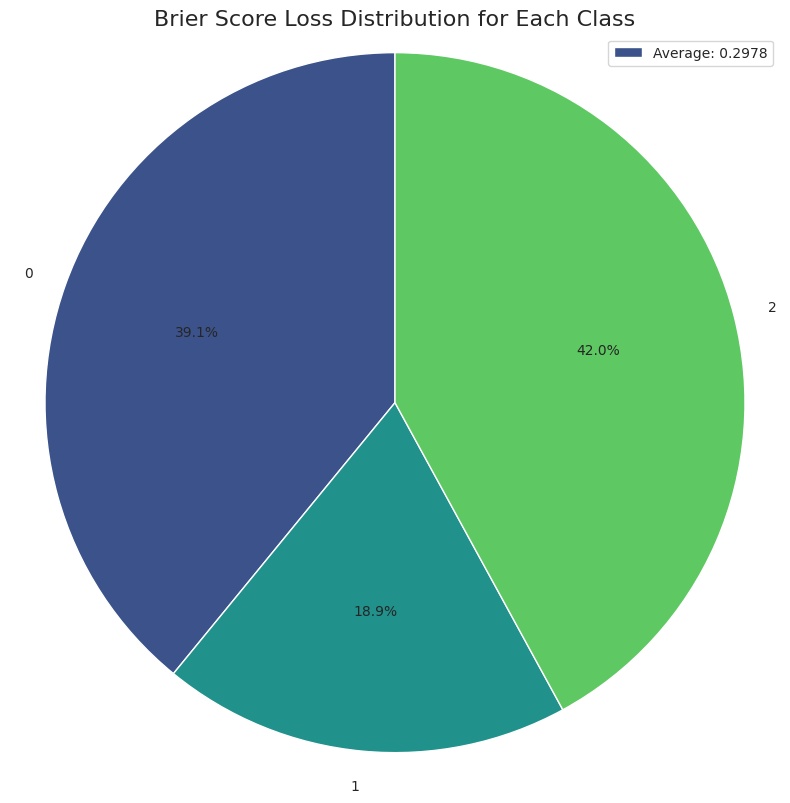

Class 0: Brier Score Loss = 0.3492
Class 1: Brier Score Loss = 0.1686
Class 2: Brier Score Loss = 0.3756
Average Brier Score Loss: 0.2978


In [38]:


# Calculate Brier Score Loss for each class
num_classes = all_outputs.shape[1]
brier_losses = []

for i in range(num_classes):
    y_true_binary = (np.array(all_labels) == i).astype(int)
    y_prob = all_outputs[:, i]
    brier_loss = brier_score_loss(y_true_binary, y_prob)
    brier_losses.append(brier_loss)

# Calculate average Brier Score Loss
avg_brier_loss = np.mean(brier_losses)

# Create a DataFrame for Seaborn
df = pd.DataFrame({
    'Class': range(num_classes),
    'Brier Score Loss': brier_losses
})

# Plotting the pie chart
plt.figure(figsize=(8, 8), facecolor='white')
plt.pie(brier_losses, labels=df['Class'], autopct='%1.1f%%', startangle=90, colors=sns.color_palette("viridis", num_classes))
plt.title('Brier Score Loss Distribution for Each Class', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show average Brier Score Loss as a legend
plt.legend([f'Average: {avg_brier_loss:.4f}'], loc='upper right')
plt.tight_layout()
plt.show()

# Print out the Brier Score Loss for each class
for i, loss in enumerate(brier_losses):
    print(f"Class {i}: Brier Score Loss = {loss:.4f}")
print(f"Average Brier Score Loss: {avg_brier_loss:.4f}")


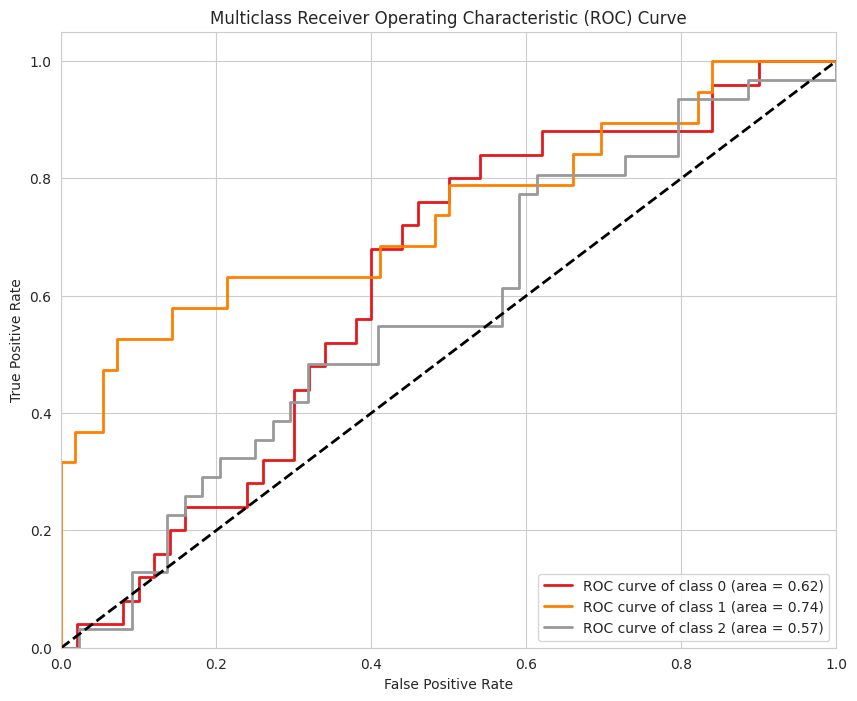

AUC for class 0: 0.6240
AUC for class 1: 0.7387
AUC for class 2: 0.5733
Micro-average AUC: 0.6706


In [39]:

from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize



# Get the number of classes
num_classes = all_outputs.shape[1]

# Binarize the labels for multiclass ROC
all_labels_bin = label_binarize(all_labels, classes=range(num_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(all_labels_bin[:, i], all_outputs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))

# Use the new method to get colormaps
colors = plt.colormaps['Set1'](np.linspace(0, 1, num_classes))

for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC for each class
for i in range(num_classes):
    print(f"AUC for class {i}: {roc_auc[i]:.4f}")

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(all_labels_bin.ravel(), all_outputs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
print(f"Micro-average AUC: {roc_auc['micro']:.4f}")

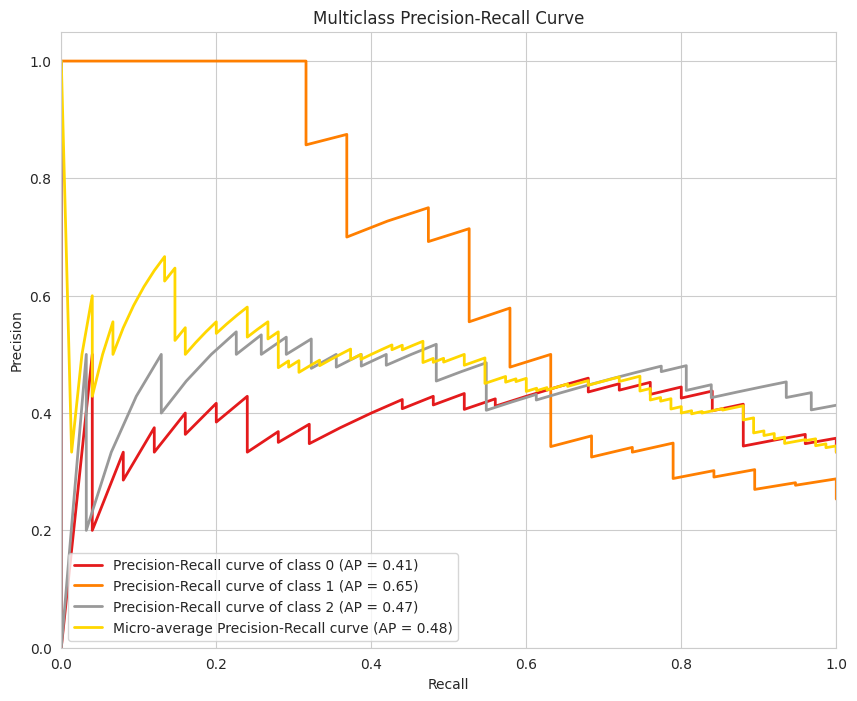

Average Precision for class 0: 0.4117
Average Precision for class 1: 0.6511
Average Precision for class 2: 0.4699
Micro-average Precision: 0.4782


In [40]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Get the number of classes
num_classes = all_outputs.shape[1]

# Binarize the labels for multiclass precision-recall curve
all_labels_bin = label_binarize(all_labels, classes=range(num_classes))

# Compute Precision-Recall curve and average precision for each class
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(all_labels_bin[:, i], all_outputs[:, i])
    average_precision[i] = average_precision_score(all_labels_bin[:, i], all_outputs[:, i])

# Compute micro-average Precision-Recall curve and average precision
precision["micro"], recall["micro"], _ = precision_recall_curve(all_labels_bin.ravel(), all_outputs.ravel())
average_precision["micro"] = average_precision_score(all_labels_bin, all_outputs, average="micro")

# Plot Precision-Recall curves
plt.figure(figsize=(10, 8))

# Use the new method to get colormaps
colors = plt.colormaps['Set1'](np.linspace(0, 1, num_classes))

for i, color in zip(range(num_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label=f'Precision-Recall curve of class {i} (AP = {average_precision[i]:.2f})')

plt.plot(recall["micro"], precision["micro"], color='gold', lw=2,
         label=f'Micro-average Precision-Recall curve (AP = {average_precision["micro"]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Multiclass Precision-Recall Curve')
plt.legend(loc="lower left")
plt.grid(True)
plt.show()

# Print Average Precision (AP) for each class
for i in range(num_classes):
    print(f"Average Precision for class {i}: {average_precision[i]:.4f}")

print(f"Micro-average Precision: {average_precision['micro']:.4f}")

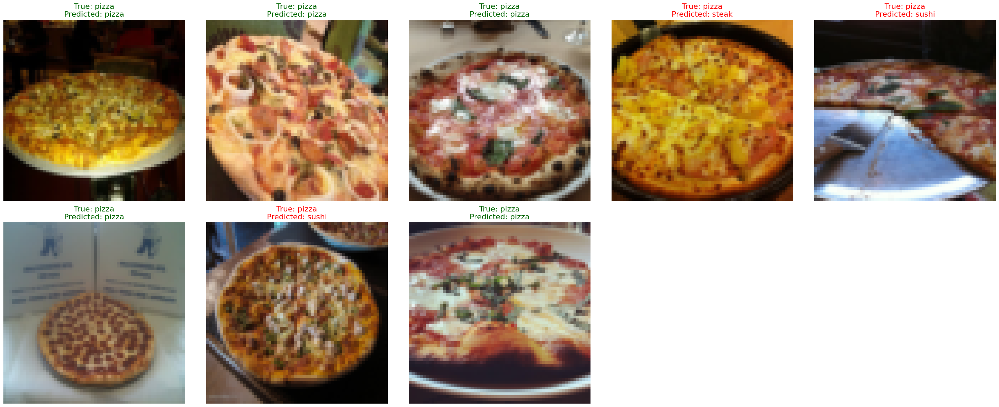

Overall accuracy: 0.62

Class-wise accuracy:
Accuracy of pizza: 5/8 (62.50%)
Accuracy of steak: No samples in this batch
Accuracy of sushi: No samples in this batch

Class distribution in this batch:
pizza: 8 samples
steak: 0 samples
sushi: 0 samples


In [41]:
import numpy as np
import torch
import matplotlib.pyplot as plt

def imshow(img):
    """Function to convert a tensor image to a NumPy array for visualization."""
    if isinstance(img, np.ndarray):
        npimg = img
    else:
        img = img / 2 + 0.5  # unnormalize
        npimg = img.numpy()

    if npimg.shape[0] == 3:  # Check if the image has 3 channels
        return np.transpose(npimg, (1, 2, 0))  # Rearrange dimensions for matplotlib
    else:
        return npimg

# Define the classes
classes = ['pizza', 'steak', 'sushi']
class_to_idx = {'pizza': 0, 'steak': 1, 'sushi': 2}

# Set the model to evaluation mode
model_0.eval()

# Get a batch of images
dataiter = iter(test_dataloader)
images, labels = next(dataiter)

# Move images and labels to the appropriate device
images, labels = images.to(device), labels.to(device)

# Get predictions
with torch.no_grad():
    outputs = model_0(images)
    _, predicted = torch.max(outputs, 1)

# Convert to numpy for easy indexing
images = images.cpu().numpy()
labels = labels.cpu().numpy()
predicted = predicted.cpu().numpy()

# Plotting the images along with true and predicted labels
plt.figure(figsize=(30, 30))
number_images = (5, 5)
num_samples = min(number_images[0] * number_images[1], len(images))

for i in range(num_samples):
    plt.subplot(number_images[0], number_images[1], i + 1)
    plt.axis("off")
    
    true_label = classes[labels[i]]
    predicted_label = classes[predicted[i]]
    
    # Set title color based on whether prediction is correct
    color = "darkgreen" if true_label == predicted_label else "red"
    
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color, fontsize=16)
    plt.imshow(imshow(images[i]))

plt.tight_layout()
plt.show()

# Calculate overall accuracy
accuracy = (predicted == labels).mean()
print(f"Overall accuracy: {accuracy:.2f}")

# Print class-wise accuracy
print("\nClass-wise accuracy:")
for cls in classes:
    idx = class_to_idx[cls]
    class_correct = (predicted == labels)[labels == idx].sum()
    class_total = (labels == idx).sum()
    if class_total > 0:
        print(f"Accuracy of {cls}: {class_correct}/{class_total} ({100 * class_correct / class_total:.2f}%)")
    else:
        print(f"Accuracy of {cls}: No samples in this batch")

# Print class distribution in the batch
print("\nClass distribution in this batch:")
for cls in classes:
    idx = class_to_idx[cls]
    class_count = (labels == idx).sum()
    print(f"{cls}: {class_count} samples")


Predicted class: pizza


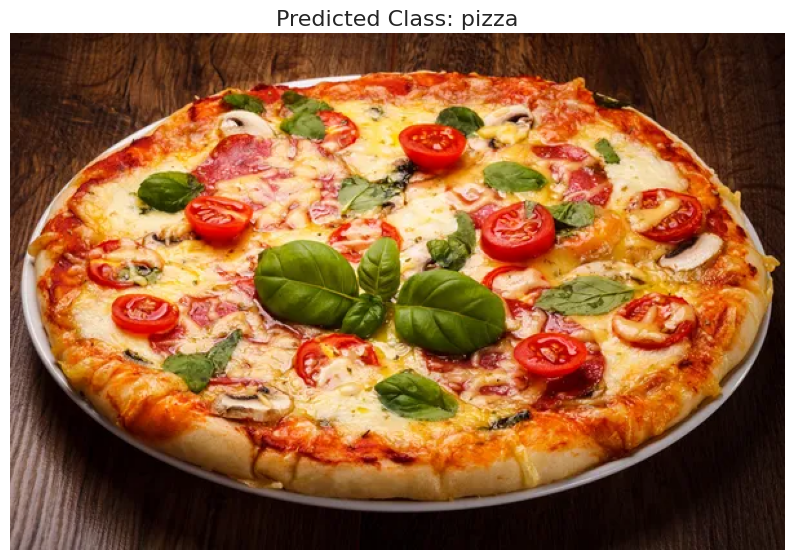

In [42]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Define the image transformation pipeline (same as during training)
custom_transform = transforms.Compose([
    transforms.Resize((64,64)),  # Resize to match model's input dimensions
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet stats
])

# Load and transform your custom data (image)
def load_image(image_path: str):
    image = Image.open(image_path).convert("RGB")  # Open and ensure image is RGB
    return image, custom_transform(image).unsqueeze(0)  # Return both raw and transformed image with batch dimension

# Prediction function
def predict_custom_data(model: torch.nn.Module, image_tensor: torch.Tensor, device: torch.device, class_names: list):
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():  # Disable gradient calculation
        image_tensor = image_tensor.to(device)  # Move image tensor to the same device as the model
        output = model(image_tensor)  # Get model predictions
        prediction = torch.argmax(output, dim=1)  # Get the index of the highest logit
        return class_names[prediction.item()]  # Convert index to class name

# Function to display the image with predicted label
def display_image_with_label(raw_image, predicted_class):
    plt.figure(figsize=(10,8))
    plt.imshow(np.array(raw_image))  # Plot the raw image
    plt.title(f"Predicted Class: {predicted_class}", fontsize=16)  # Set the title with predicted label
    plt.axis('off')  # Hide axes
    plt.show()

# Your class names and class_to_idx mapping (train_data.classes and train_data.class_to_idx)
class_names = ['pizza', 'steak', 'sushi']  # or use train_data.classes

# Path to your custom image
image_path = "/kaggle/input/custom-image-dataset/pizza.jpg"

# Load and preprocess the image
raw_image, image_tensor = load_image(image_path)

# Load your trained model and move it to the appropriate device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TinyVGG(input_shape=3, hidden_units=10, output_shape=len(class_names)).to(device)

# Predict the class for the custom image
predicted_class = predict_custom_data(model, image_tensor, device, class_names)

# Output the prediction and plot the image with label
print(f"Predicted class: {predicted_class}")
display_image_with_label(raw_image, predicted_class)
